<a href="https://colab.research.google.com/github/SantonioTheFirst/DocumentScanner/blob/main/DocumentScanner.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
height, width = 512, 512

In [28]:
img = cv2.imread('my.png')
height, width, _ = img.shape

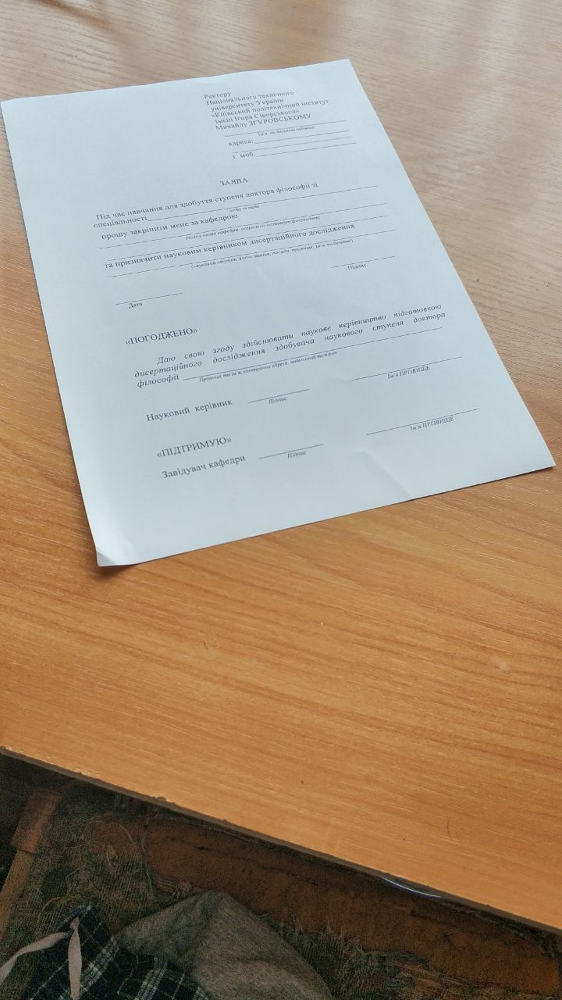

In [29]:
cv2_imshow(img)

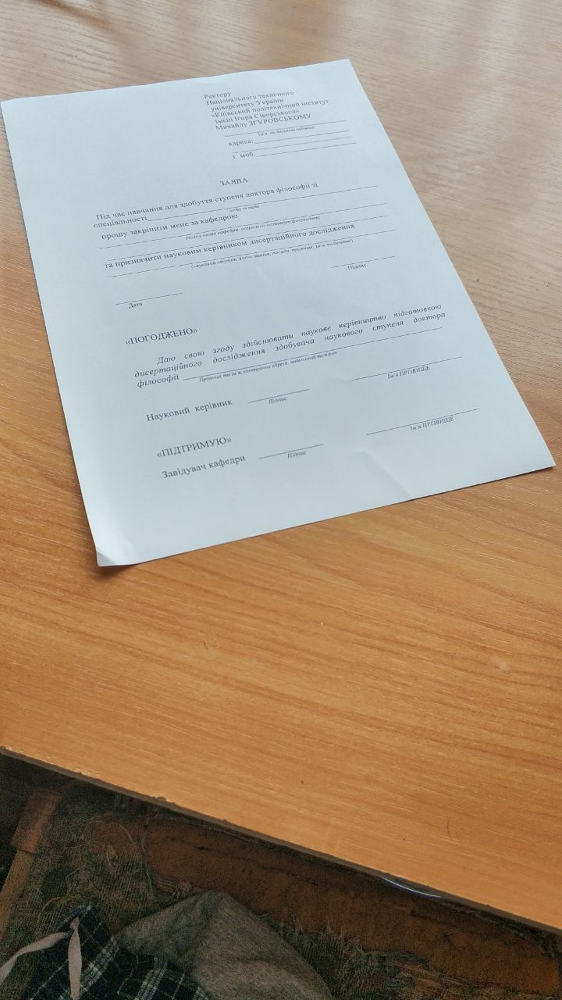

In [30]:
# RESIZE IMAGE
img = cv2.resize(img, (width, height))
cv2_imshow(img)

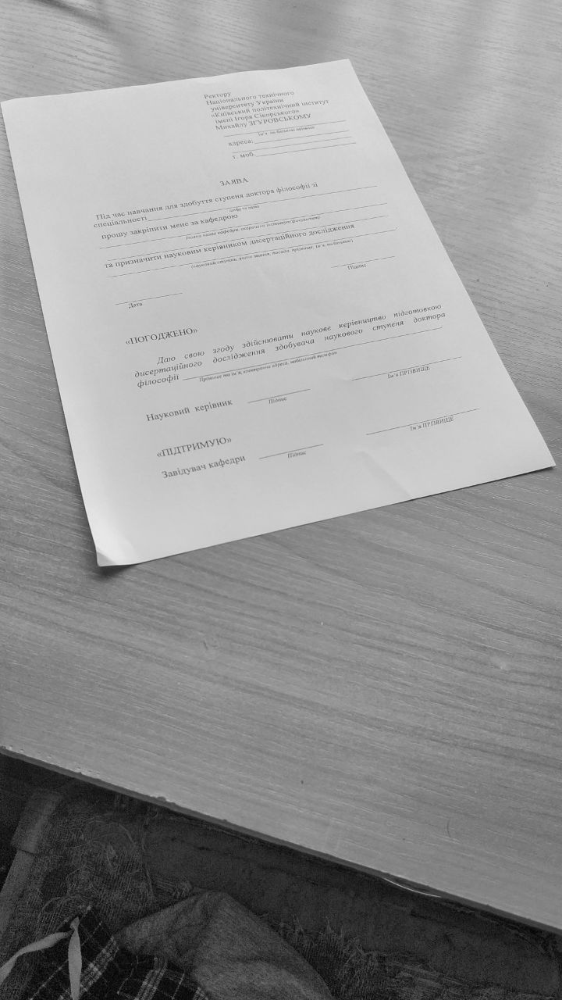

In [31]:
# CREATE A BLANK IMAGE
# imgBlank = np.zeros((height,width, 3), np.uint8)
# CONVERT IMAGE TO GRAY SCALE
imgGray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(imgGray)

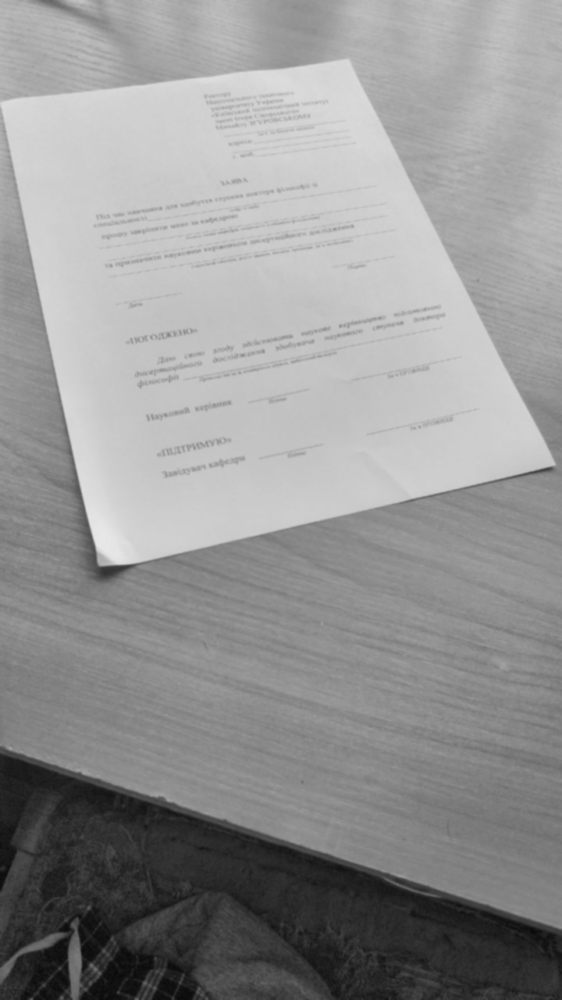

In [32]:
# ADD GAUSSIAN BLUR
imgBlur = cv2.GaussianBlur(imgGray, (5, 5), 1)
cv2_imshow(imgBlur)

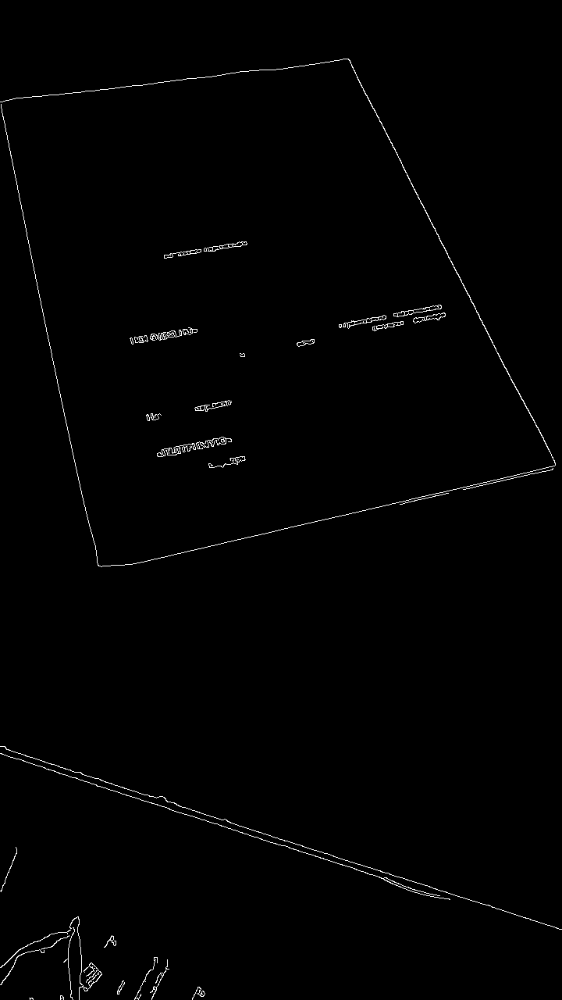

In [33]:
# thres = utlis.valTrackbars() # GET TRACK BAR VALUES FOR THRESHOLDS
# APPLY CANNY BLUR
imgThreshold = cv2.Canny(
    image=imgBlur,
    threshold1=50,
    threshold2=150,
    apertureSize=3,
    L2gradient=True
)
cv2_imshow(imgThreshold)

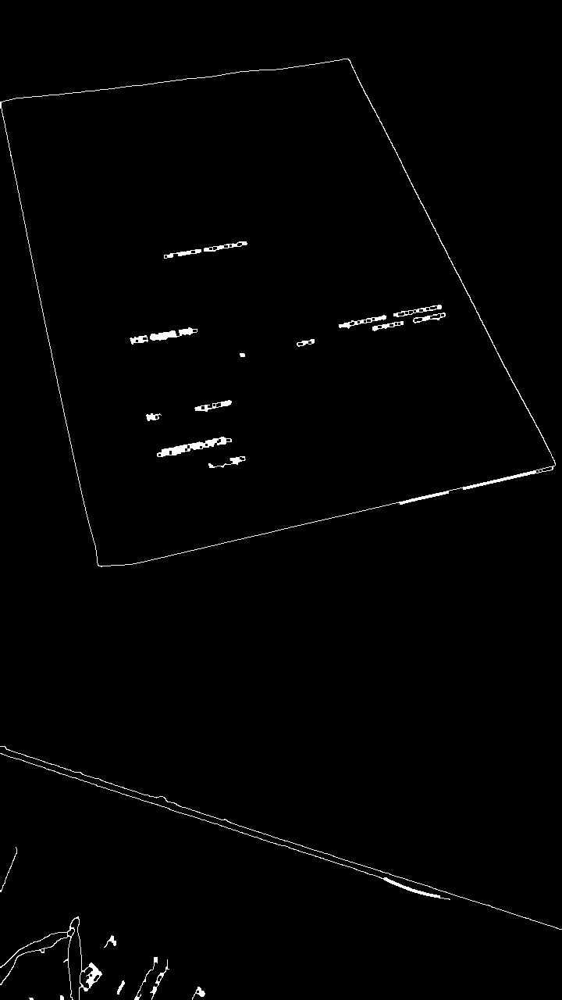

In [34]:
kernel = np.ones((3, 3))
imgDial = cv2.dilate(imgThreshold, kernel, iterations=1) # APPLY DILATION
imgThreshold = cv2.erode(imgDial, kernel, iterations=1)  # APPLY EROSION
cv2_imshow(imgThreshold)

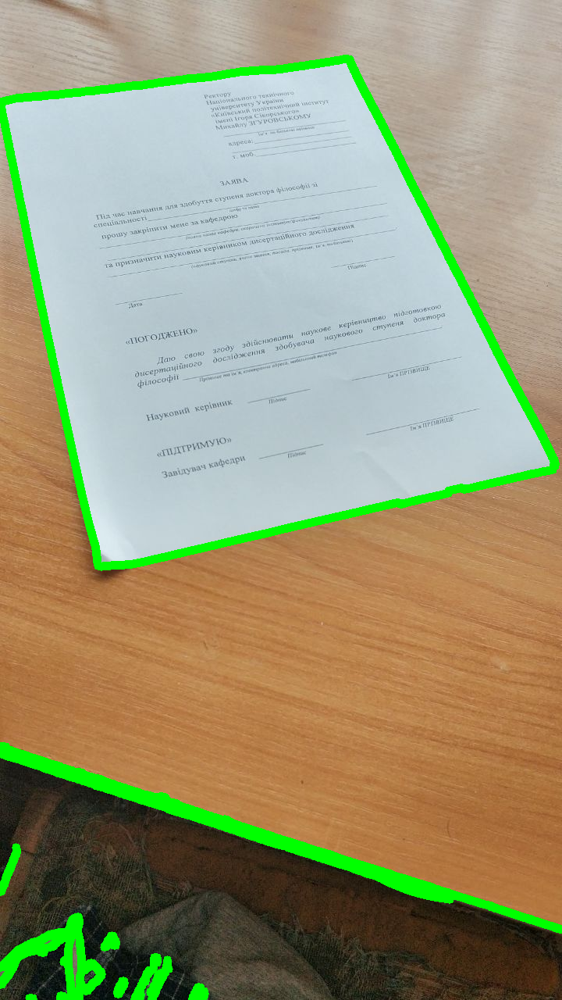

In [35]:
## FIND ALL COUNTOURS
imgContours = img.copy() # COPY IMAGE FOR DISPLAY PURPOSES
imgBigContour = img.copy() # COPY IMAGE FOR DISPLAY PURPOSES
contours, hierarchy = cv2.findContours(imgThreshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) # FIND ALL CONTOURS
cv2.drawContours(imgContours, contours, -1, (0, 255, 0), 10) # DRAW ALL DETECTED CONTOURS
cv2_imshow(imgContours)

In [36]:
contour_area_threshold = 10000

def find_contours(countours):
    top_contours = []
    top_rect_contours = []
    for contour in contours:
        area = cv2.contourArea(contour)
        # print(area)
        if area > contour_area_threshold:
            peri = cv2.arcLength(contour, True)
            approx = cv2.approxPolyDP(contour, 0.02 * peri, True)
            # print(len(approx))
            if len(approx) in (4, 5, 6, 7):
                top_contours.append(approx)
                rectangle = cv2.minAreaRect(approx)
                pts = cv2.boxPoints(rectangle)
                pts = pts.reshape(-1, 1, 2)
                pts = pts.astype(int)
                top_rect_contours.append(pts)
    return np.array(top_contours)

In [37]:
top_contours = find_contours(contours)

In [38]:
top_contours

array([[[[446,  75]],

        [[  0, 130]],

        [[126, 724]],

        [[711, 595]]]], dtype=int32)

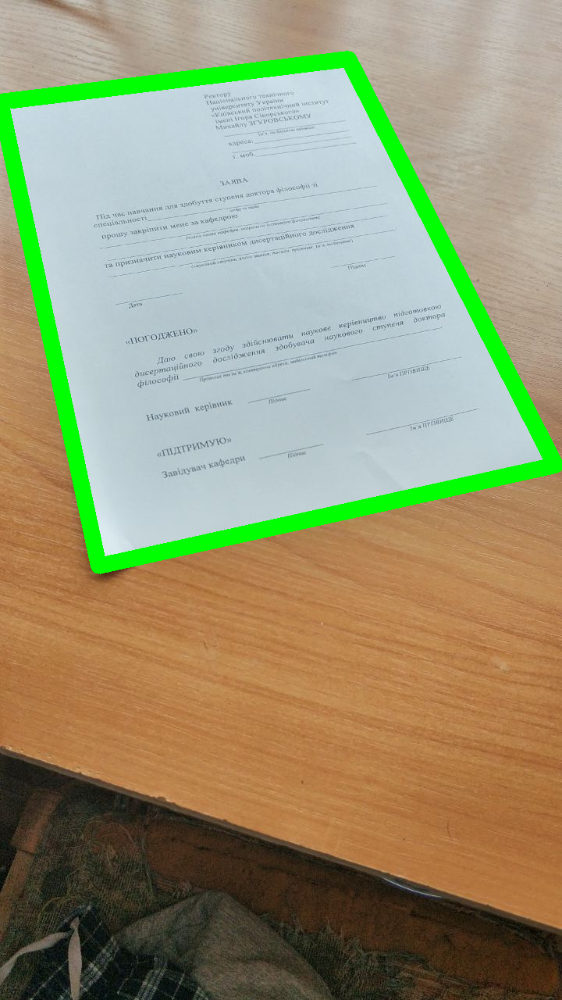

In [39]:
cv2.drawContours(imgBigContour, top_contours, -1, (0, 255, 0), 20)
cv2_imshow(imgBigContour)

In [40]:
def reorder(myPoints):
    result = []
    for points in myPoints:
        points = points.reshape((4, 2))
        pointsNew = np.zeros((4, 1, 2), dtype=np.int32)
        add = points.sum(1)

        pointsNew[0] = points[np.argmin(add)]
        pointsNew[3] = points[np.argmax(add)]
        diff = np.diff(points, axis=1)
        pointsNew[1] = points[np.argmin(diff)]
        pointsNew[2] = points[np.argmax(diff)]
        result.append(pointsNew)

    return np.array(result, dtype=np.float32)

In [41]:
top_contours

array([[[[446,  75]],

        [[  0, 130]],

        [[126, 724]],

        [[711, 595]]]], dtype=int32)

In [42]:
pts1 = reorder(top_contours)

In [43]:
pts1

array([[[[  0., 130.]],

        [[446.,  75.]],

        [[126., 724.]],

        [[711., 595.]]]], dtype=float32)

In [45]:
pts1[0].tolist()

[[[0.0, 130.0]], [[446.0, 75.0]], [[126.0, 724.0]], [[711.0, 595.0]]]

In [ ]:
pts1[0].shape

(4, 1, 2)

In [46]:
pts2 = np.float32([[0, 0], [width, 0], [0, height], [width, height]]) # PREPARE POINTS FOR WARP

In [47]:
matrix = cv2.getPerspectiveTransform(pts1[0], pts2)
imgWarpColored = cv2.warpPerspective(img, matrix, (width, height))

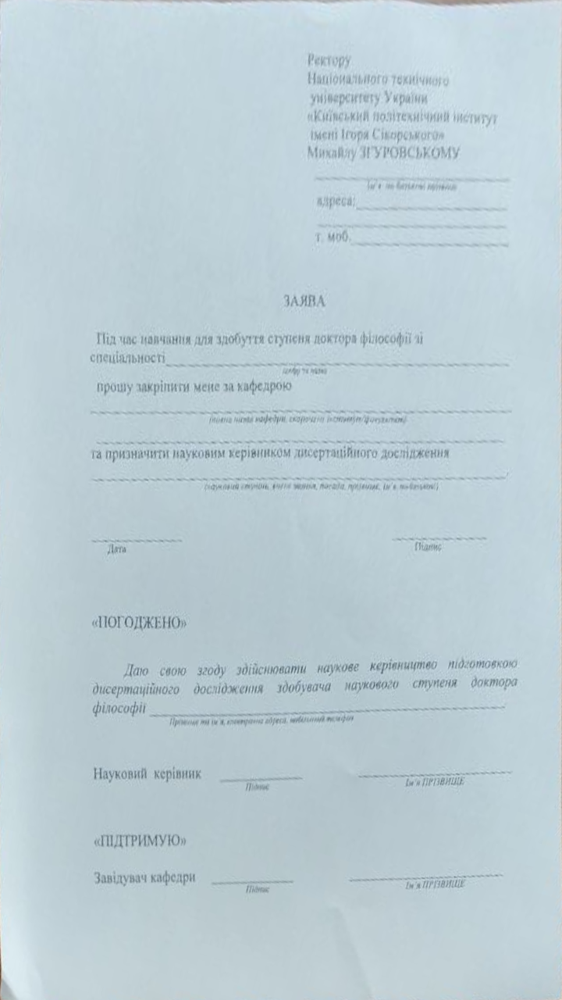

In [48]:
cv2_imshow(imgWarpColored)

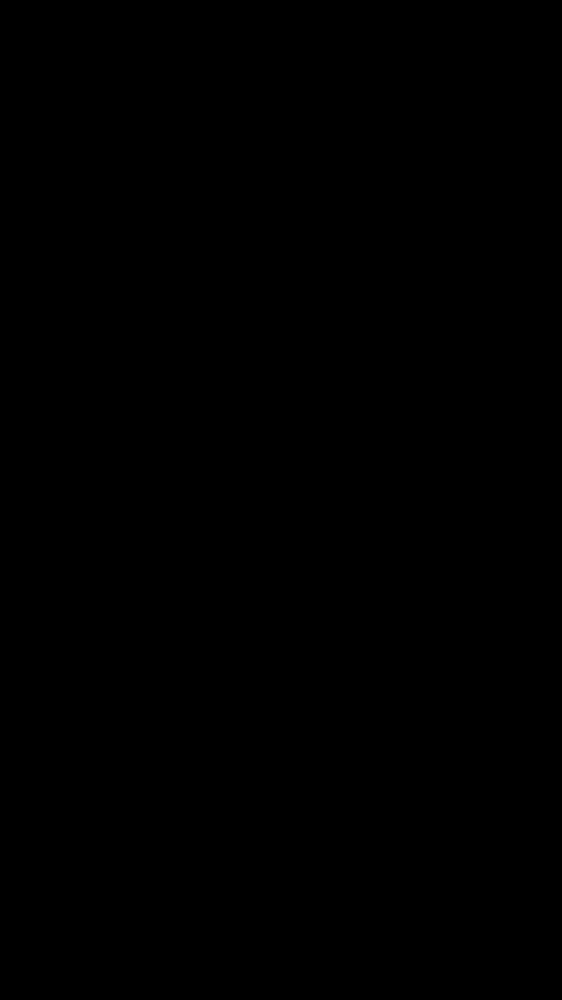

In [ ]:
bg = np.zeros_like(img)
cv2_imshow(bg)

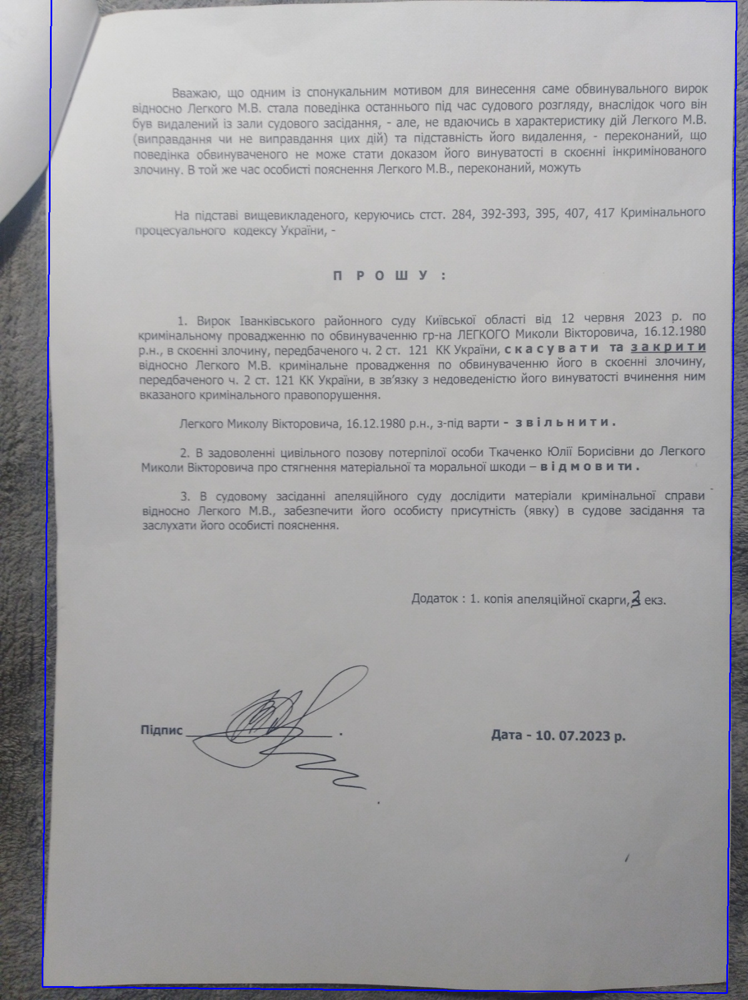

In [ ]:
rectangle = cv2.minAreaRect(list(top_contours.values())[0])

# conver the minAreaRect output to points
pts = cv2.boxPoints(rectangle)
# contours must be of shape (n, 1, 2) and dtype integer
pts = pts.reshape(-1, 1, 2)
pts = pts.astype(int)

# draw contours and display
rectangle_contour = img.copy()
cv2.drawContours(rectangle_contour, [pts], -1, (255, 0, 0), 2)
cv2_imshow(rectangle_contour)

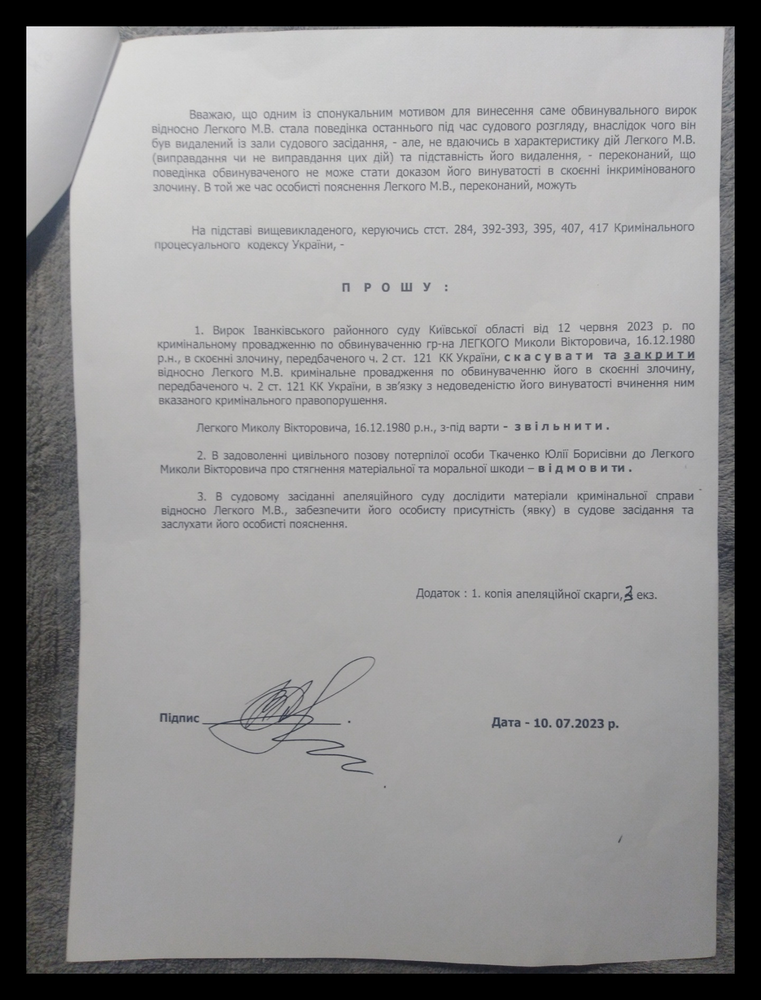

In [ ]:
image = cv2.copyMakeBorder(img, 50, 50, 50, 50, cv2.BORDER_CONSTANT)
cv2_imshow(image)

In [ ]:
def add_border(img: np.ndarray, border_size: int = 50, value: int = 255) -> np.ndarray:
    border = [border_size for i in range(4)]
    value = [value for i in range(3)]
    return cv2.copyMakeBorder(img, *border, cv2.BORDER_CONSTANT, value=value)

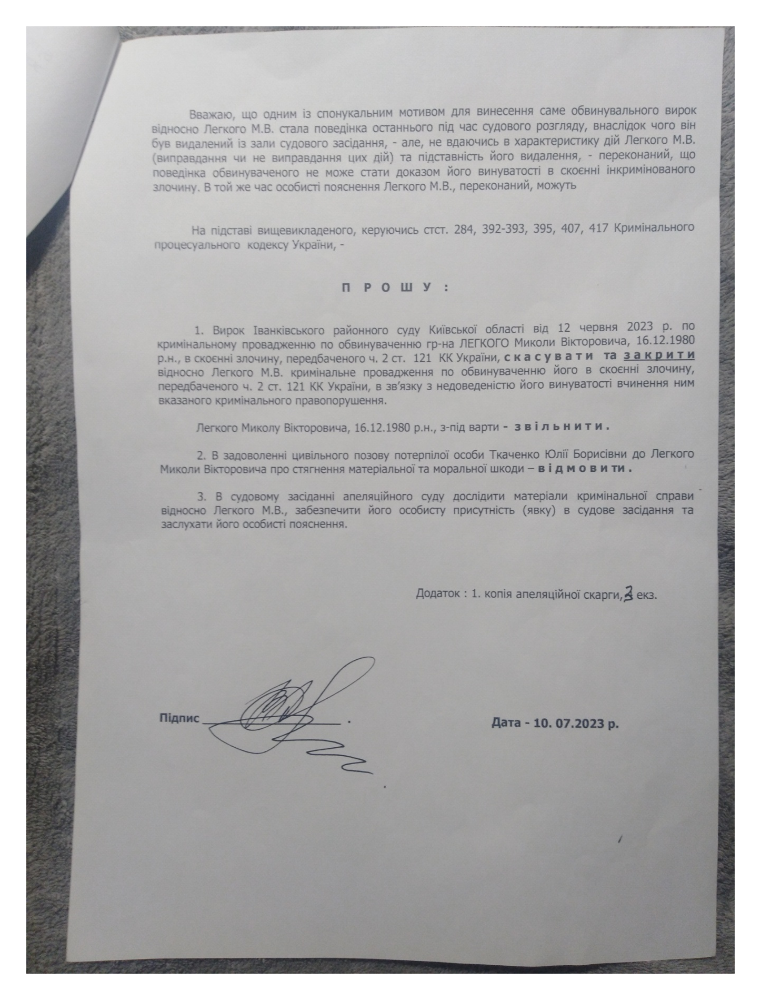

In [ ]:
cv2_imshow(add_border(img))

In [49]:
def resize(img: np.ndarray, width: int, height: int) -> np.ndarray:
    img: np.ndarray = cv2.resize(img, (width, height))
    return img

In [50]:
def to_grayscale(img: np.ndarray) -> np.ndarray:
    img: np.ndarray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img

In [51]:
def add_gaussian_blur(img: np.ndarray) -> np.ndarray:
    img: np.ndarray = cv2.GaussianBlur(img, (5, 5), 1)
    return img

In [52]:
def apply_Canny_filter(
    img: np.ndarray,
    threshold1: int = 50,
    threshold2: int = 100,
    aperture_size: int = 3
) -> np.ndarray:
    img: np.ndarray = cv2.Canny(
        image=img,
        threshold1=threshold1,
        threshold2=threshold2,
        apertureSize=3,
        L2gradient=True
    )
    return img

In [53]:
def dilate_and_erode(
    img: np.ndarray,
    kernel: np.ndarray = np.ones((3, 3)),
    d_iter: int = 1,
    e_iter: int = 1
) -> np.ndarray:
    imgDial: np.ndarray = cv2.dilate(img, kernel, iterations=d_iter)
    imgThreshold: np.ndarray = cv2.erode(imgDial, kernel, iterations=e_iter)
    return imgThreshold

In [54]:
def get_all_contours(img: np.ndarray, imgThreshold: np.ndarray) -> np.ndarray:
    imgContours: np.ndarray = img.copy()
    contours: tuple[np.ndarray, None] = cv2.findContours(imgThreshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours: np.ndarray = contours[0]
    #allContours: np.ndarray = cv2.drawContours(imgContours, contours, -1, (0, 255, 0), 10)
    return contours

In [63]:
def get_top_contours(img: np.ndarray, contours: np.ndarray, contour_area_threshold: float = 10000) -> tuple[list[np.ndarray], np.ndarray]:
    top_contours: list[np.ndarray] = []
    imgContours: np.ndarray = img.copy()
    for contour in contours:
        #print(np.float32(contour), type(contour))
        area: float = cv2.contourArea(np.float32(contour))
        if area > contour_area_threshold:
            peri = cv2.arcLength(contour, True)
            approx: np.ndarray = cv2.approxPolyDP(contour, 0.02 * peri, True)
            # print(len(approx))
            if len(approx) in set([4, 5]):
                top_contours.append(approx)
    imgContours: np.ndarray = cv2.drawContours(imgContours, top_contours, -1, (0, 255, 0), 20)
    return np.array(top_contours), imgContours

In [64]:
def reorder(myPoints: np.ndarray) -> np.ndarray:
    result: list[np.ndarray] = []
    for points in myPoints:
        points: np.ndarray = points.reshape((4, 2))
        pointsNew: np.ndarray = np.zeros((4, 1, 2), dtype=np.int32)
        add: np.ndarray = points.sum(1)

        pointsNew[0] = points[np.argmin(add)]
        pointsNew[3] = points[np.argmax(add)]
        diff: np.ndarray = np.diff(points, axis=1)
        pointsNew[1] = points[np.argmin(diff)]
        pointsNew[2] = points[np.argmax(diff)]
        result.append(pointsNew)

    return np.array(result, dtype=np.float32)

In [65]:
def transform(img: np.ndarray, pts1: np.ndarray, pts2: np.ndarray) -> np.ndarray:
    matrix = cv2.getPerspectiveTransform(pts1, pts2)
    result: np.ndarray = cv2.warpPerspective(img, matrix, (width, height))
    return result

In [76]:
def preprocess(img: np.ndarray, width: int, height: int) -> np.ndarray:
    #imgBorder: np.ndarray = add_border(img)
    resizedImg: np.ndarray = resize(img, width, height)
    grayImg: np.ndarray = to_grayscale(resizedImg)
    blurredImg: np.ndarray = add_gaussian_blur(grayImg)
    CannyImg: np.ndarray = apply_Canny_filter(blurredImg)
    deImg: np.ndarray = dilate_and_erode(CannyImg)
    allContours: np.ndarray = get_all_contours(img, deImg)
    #cv2_imshow(allContours)
    #print(type(allContours), allContours)
    topContours: tuple[np.ndarray, np.ndarray] = get_top_contours(img, allContours)
    imgContours: np.ndarray = topContours[1]
    topContours: np.ndarray = topContours[0]
    print(topContours.shape)
    pts1: np.ndarray = reorder(topContours)
    pts2: np.ndarray = np.float32([[0, 0], [width, 0], [0, height], [width, height]])
    print(pts1.shape)
    transformedImgs: np.ndarray = [transform(img, p, pts2) for p in pts1]
    for transformedImg in transformedImgs:
        cv2_imshow(transformedImg)

(1, 4, 1, 2)
(1, 4, 1, 2)


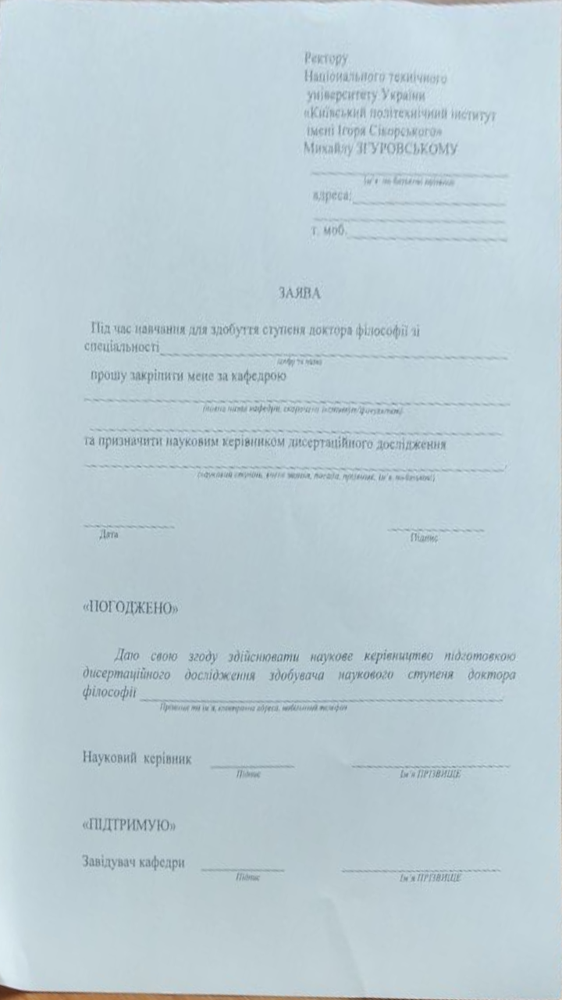

In [77]:
preprocess(img, width, height)

In [78]:
pts1

array([[[[  0., 130.]],

        [[446.,  75.]],

        [[126., 724.]],

        [[711., 595.]]]], dtype=float32)

In [88]:
pts1.shape

(1, 4, 1, 2)

In [79]:
pts1[0][0][0]

array([  0., 130.], dtype=float32)

In [80]:
pts1[0][1][0]

array([446.,  75.], dtype=float32)

In [83]:
np.sqrt(np.array([25])[0])

5.0

In [89]:
np.squeeze(pts1[0]).shape

(4, 2)

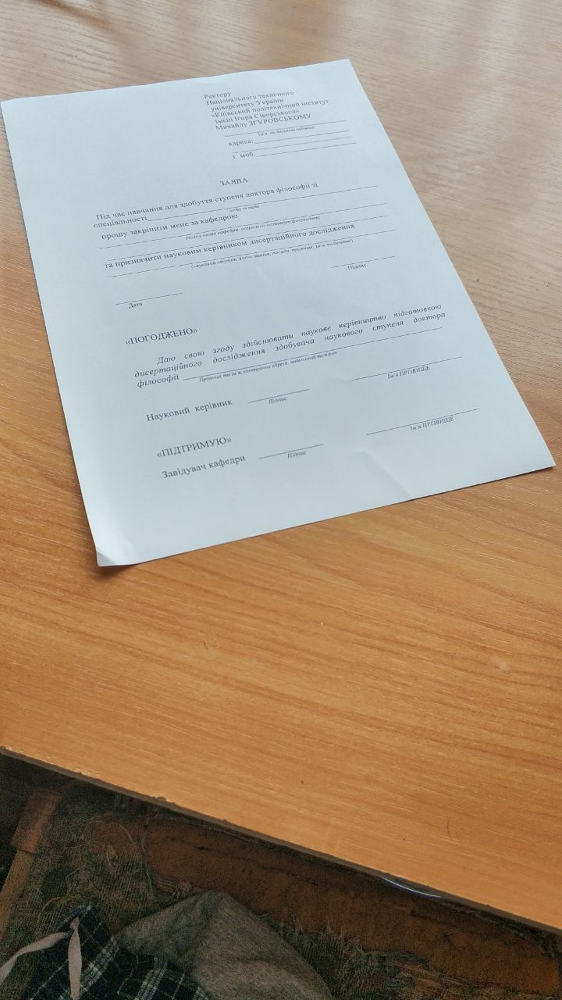

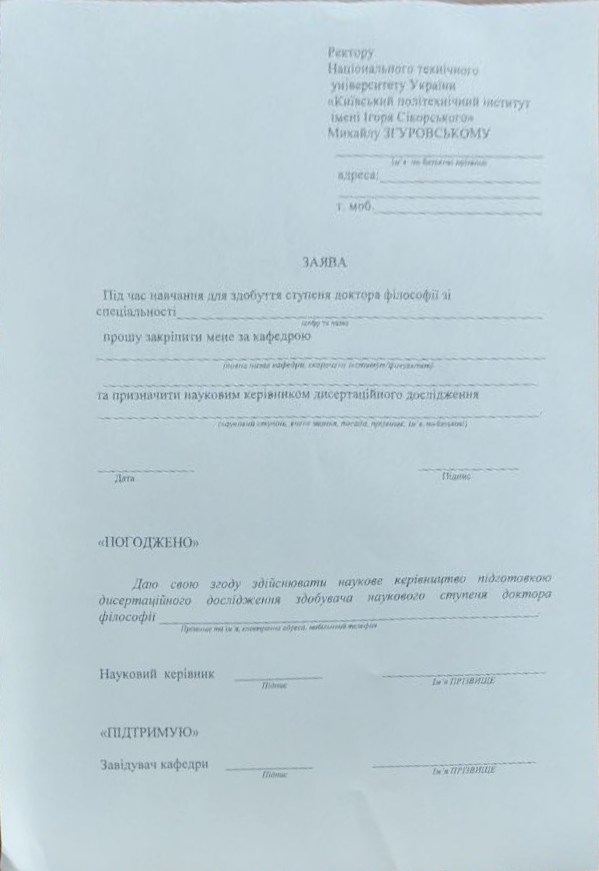

In [93]:
import math
#import cv2
import scipy.spatial.distance
#import numpy as np

(rows,cols,_) = img.shape

#image center
u0 = (cols) / 2.0
v0 = (rows) / 2.0

#detected corners on the original image
p = np.squeeze(pts1[0].copy())

#widths and heights of the projected image
w1 = scipy.spatial.distance.euclidean(p[0], p[1])
w2 = scipy.spatial.distance.euclidean(p[2], p[3])

h1 = scipy.spatial.distance.euclidean(p[0], p[2])
h2 = scipy.spatial.distance.euclidean(p[1], p[3])

w = np.max(np.array([w1, w2]))
h = np.max(np.array([h1, h2]))

#visible aspect ratio
ar_vis = float(w) / float(h)

#make numpy arrays and append 1 for linear algebra
m1 = np.array((p[0][0], p[0][1], 1)).astype('float32')
m2 = np.array((p[1][0], p[1][1], 1)).astype('float32')
m3 = np.array((p[2][0], p[2][1], 1)).astype('float32')
m4 = np.array((p[3][0], p[3][1], 1)).astype('float32')

#calculate the focal disrance
k2 = np.dot(np.cross(m1, m4), m3) / np.dot(np.cross(m2, m4), m3)
k3 = np.dot(np.cross(m1, m4), m2) / np.dot(np.cross(m3, m4), m2)

n2 = k2 * m2 - m1
n3 = k3 * m3 - m1

n21 = n2[0]
n22 = n2[1]
n23 = n2[2]

n31 = n3[0]
n32 = n3[1]
n33 = n3[2]

f = np.sqrt(np.abs((1.0 / (n23 * n33)) * ((n21 * n31 - (n21 * n33 + n23 * n31) * u0 + n23 * n33 * u0 * u0) + (n22 * n32 - (n22 * n33 + n23 * n32) * v0 + n23 * n33 * v0 * v0))))

A = np.array([[f, 0, u0], [0, f, v0],[0, 0, 1]]).astype('float32')

At = np.transpose(A)
Ati = np.linalg.inv(At)
Ai = np.linalg.inv(A)

#calculate the real aspect ratio
ar_real = np.sqrt(np.dot(np.dot(np.dot(n2, Ati), Ai), n2) / np.dot(np.dot(np.dot(n3, Ati), Ai), n3))

if ar_real < ar_vis:
    W = int(w)
    H = int(W / ar_real)
else:
    H = int(h)
    W = int(ar_real * H)

pts1_t = np.array(p).astype('float32')
pts2 = np.float32([[0, 0], [W, 0], [0, H], [W, H]])

#project the image with the new w/h
M = cv2.getPerspectiveTransform(pts1_t, pts2)

dst = cv2.warpPerspective(img, M, (W, H))

cv2_imshow(img)
cv2_imshow(dst)

In [ ]:
np.max(np.